# Molecular dynamics simulation trajectory analysis

## Setup

In [1]:
# Imports
import os

from pymol import cmd
print("Pymol version: ", cmd.get_version()[0])

import numpy as np
print("Numpy version: ", np.__version__)

import sklearn
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
print("Sklearn version: ", sklearn.__version__)

import scipy
from scipy.stats import gaussian_kde
print("Scipy version: ", scipy.__version__)

import matplotlib
import matplotlib.pyplot as plt
print("Matplotlib version: ", matplotlib.__version__)

import pandas as pd
print("Pandas version: ", pd.__version__)

import seaborn as sns
print("Seaborn version: ", sns.__version__)


Pymol version:  3.0.0
Numpy version:  1.26.4
Sklearn version:  1.4.2
Scipy version:  1.13.0
Matplotlib version:  3.8.4
Pandas version:  2.2.2
Seaborn version:  0.13.2


In [2]:
# Change to the working directory
wrkdir = "~/research/synthetic_opioids/U48800/rest/water/analysis"
os.chdir(wrkdir)

## Trajectory analysis

In [4]:
# Reinitialize and load molecule and trajectory as before
cmd.reinitialize()

# Set background color to white
cmd.bg_color(color="white")

cmd.load("U48800.pdb")
cmd.load_traj("trajout.xtc", "U48800")
cmd.center("U48800")

 ObjectMolecule: read set 1 into state 1...
 ObjectMolecule: read set 2 into state 2...
 ObjectMolecule: read set 3 into state 3...
 ObjectMolecule: read set 4 into state 4...
 ObjectMolecule: read set 5 into state 5...
 ObjectMolecule: read set 6 into state 6...
 ObjectMolecule: read set 7 into state 7...
 ObjectMolecule: read set 8 into state 8...
 ObjectMolecule: read set 9 into state 9...
 ObjectMolecule: read set 10 into state 10...
 ObjectMolecule: read set 11 into state 11...
 ObjectMolecule: read set 12 into state 12...
 ObjectMolecule: read set 13 into state 13...
 ObjectMolecule: read set 14 into state 14...
 ObjectMolecule: read set 15 into state 15...
 ObjectMolecule: read set 16 into state 16...
 ObjectMolecule: read set 17 into state 17...
 ObjectMolecule: read set 18 into state 18...
 ObjectMolecule: read set 19 into state 19...
 ObjectMolecule: read set 20 into state 20...
 ObjectMolecule: read set 21 into state 21...
 ObjectMolecule: read set 22 into state 22...
 Objec

## Cyclohexane ring

In [10]:
# Determine the number of states
num_states = cmd.count_states("U48800")

# Extract torsion angles across all states
C1 = "U48800 and id 4"
C2 = "U48800 and id 5"
C3 = "U48800 and id 6"
C4 = "U48800 and id 7"
C5 = "U48800 and id 8"
C6 = "U48800 and id 9"

torsion_angles = []
for state in range(1, num_states + 1):
    C1C2C3C4 = cmd.get_dihedral(C1, C2, C3, C4, state=state)
    C2C3C4C5 = cmd.get_dihedral(C2, C3, C4, C5, state=state)
    C3C4C5C6 = cmd.get_dihedral(C3, C4, C5, C6, state=state)
    C4C5C6C1 = cmd.get_dihedral(C4, C5, C6, C1, state=state)
    C5C6C1C2 = cmd.get_dihedral(C5, C6, C1, C2, state=state)
    C6C1C2C3 = cmd.get_dihedral(C6, C1, C2, C3, state=state)
    torsion_angles.append((C1C2C3C4, C2C3C4C5, C3C4C5C6, C4C5C6C1, C5C6C1C2, C6C1C2C3))

# Assuming torsion_angles is a list of (torsion_1, torsion_2) tuples
df = pd.DataFrame(torsion_angles, columns=['C1C2C3C4', 'C2C3C4C5', 'C3C4C5C6', 'C4C5C6C1', 'C5C6C1C2', 'C6C1C2C3'])

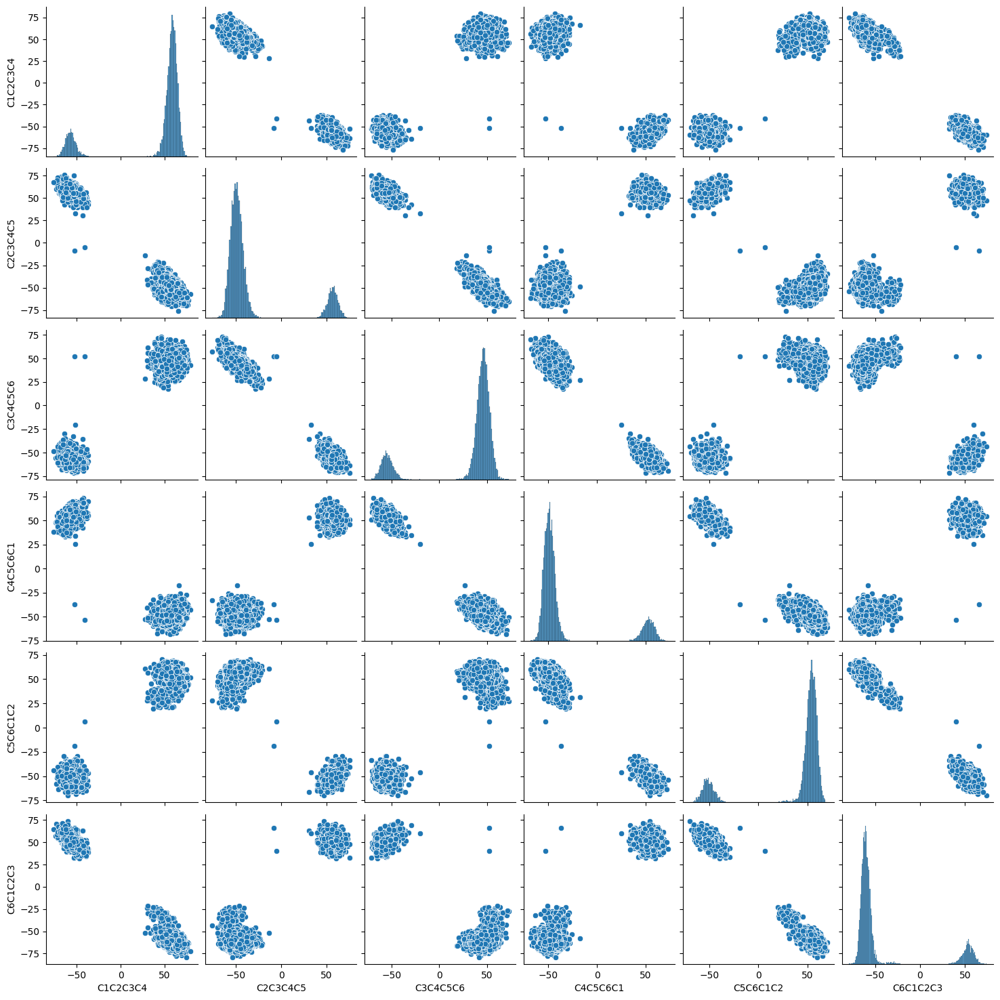

In [11]:
# Add a 'State' column to the DataFrame
df['State'] = range(1, len(df) + 1)

sns.pairplot(df[['C1C2C3C4', 'C2C3C4C5', 'C3C4C5C6', 'C4C5C6C1', 'C5C6C1C2', 'C6C1C2C3']])

In [12]:
# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Cluster using DBSCAN with adjusted parameters
dbscan = DBSCAN(eps=1.5, min_samples=2)  # Example parameters; adjust as needed
clusters_dbscan = dbscan.fit_predict(df_scaled)

# Add cluster labels to the original DataFrame
df['Cluster'] = clusters_dbscan

# Print the number of clusters_dbscan found
num_clusters = len(set(clusters_dbscan)) - (1 if -1 in clusters_dbscan else 0)  # Exclude outliers
print(f"Number of clusters_dbscan detected: {num_clusters}")

# Count the number of points in each cluster
cluster_counts = df['Cluster'].value_counts()

# Calculate the percentage of points in each cluster
cluster_percentages = cluster_counts / len(df) * 100

# Print cluster counts and percentages
for cluster_id, count in cluster_counts.items():
    percentage = cluster_percentages[cluster_id]
    print(f"Cluster {cluster_id}: {count} structures ({percentage:.2f}%)")

# If you want to include outliers (-1 cluster):
if -1 in cluster_counts:
    outlier_count = cluster_counts[-1]
    outlier_percentage = cluster_percentages[-1]
    print(f"Outliers (-1): {outlier_count} points ({outlier_percentage:.2f}%)")

Number of clusters detected: 3
Cluster 0: 8383 structures (83.82%)
Cluster 1: 1616 structures (16.16%)
Cluster 2: 2 structures (0.02%)


In [ ]:
# Selection string for the atoms of interest
selection = "id 4 or id 5 or id 6 or id 7 or id 8 or id 9"

# Align all states to the first state
cmd.intra_fit(selection, 1)

In [14]:
# Create a new object for each cluster
cmd.delete("cluster_*")
grouped = df.groupby('Cluster')
for cluster, group_df in grouped:
    new_object_name = f"cluster_{cluster}"
    states = group_df['State'].tolist()
    
    for state in states:
        cmd.create(new_object_name, "U48800", state, -1)
        
# Hide the original object
cmd.disable("all")

In [15]:
cmd.save("ciclohexane_cluster_0.sdf", "cluster_0", state=0)
cmd.save("ciclohexane_cluster_1.sdf", "cluster_1", state=0)
cmd.save("ciclohexane_cluster_2.sdf", "cluster_2", state=0)

In [16]:
cmd.hide("all")
cmd.show("lines")
cmd.set("line_width", 2)

# Define structures to view as transparent (Note: This selection works only for the original pdb and attached trajectory, 
# if using the saved sdf files, atom id 10 should be added and atoms id 4 and 8 should be removed)
cmd.select("trnsprnt", "not (id 4 or id 5 or id 6 or id 7 or id 8 or id 9 or id 29 or id 30 or id 31 or id 32 or id 33 or id 34 or id 35 or id 36 or id 37 or id 38)")

# Define transparent atoms and bonds
cmd.set("line_width", 0.5, "trnsprnt")
cmd.util.cba(104)

In [17]:
# Set all  states to be displayed
cmd.set("all_states", "on")

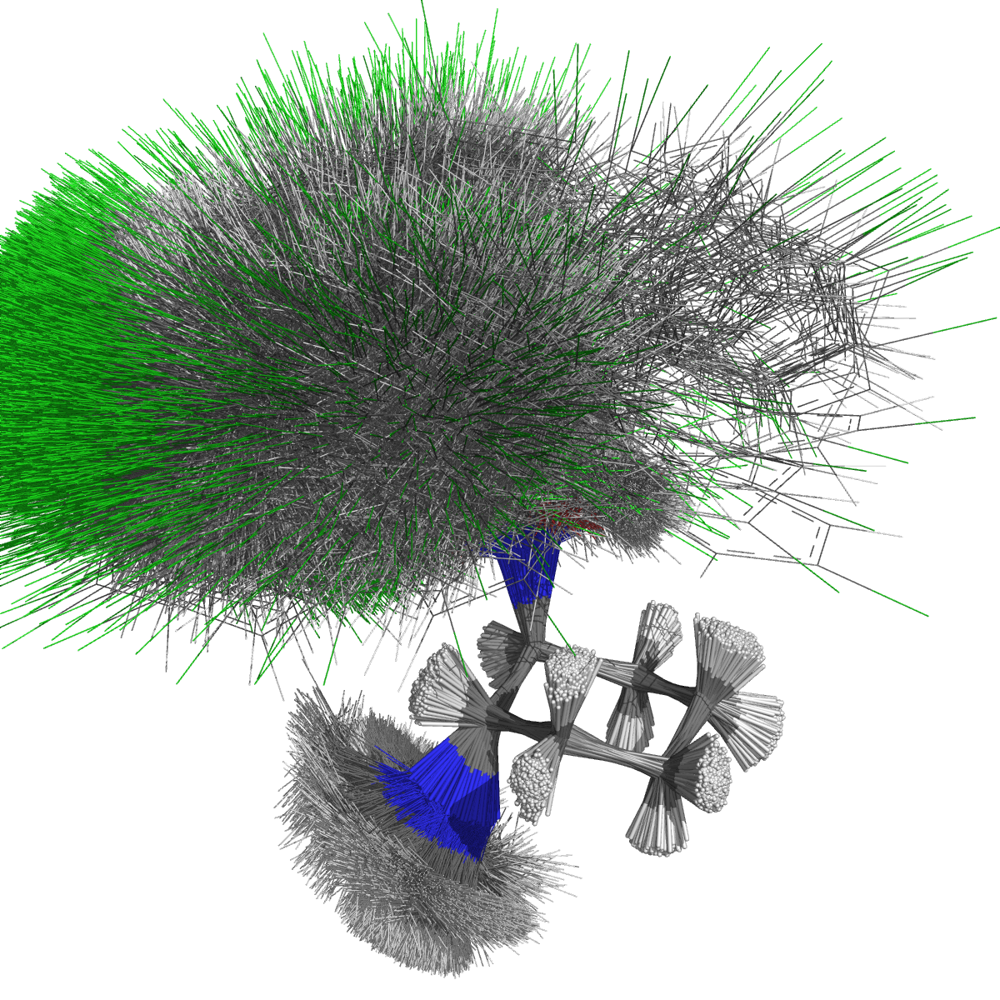

In [20]:
cmd.disable("all")
cmd.enable("cluster_0")

cmd.set_view([ \
    0.677704155,    0.690858841,   -0.251855195,\
    -0.431941986,    0.096825600,   -0.896688521,\
    -0.595099032,    0.716476917,    0.364029944,\
     0.000003815,    0.000004221,  -34.279537201,\
    15.987197876,   11.594167709,   17.383502960,\
   -68.738189697,  137.297653198,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

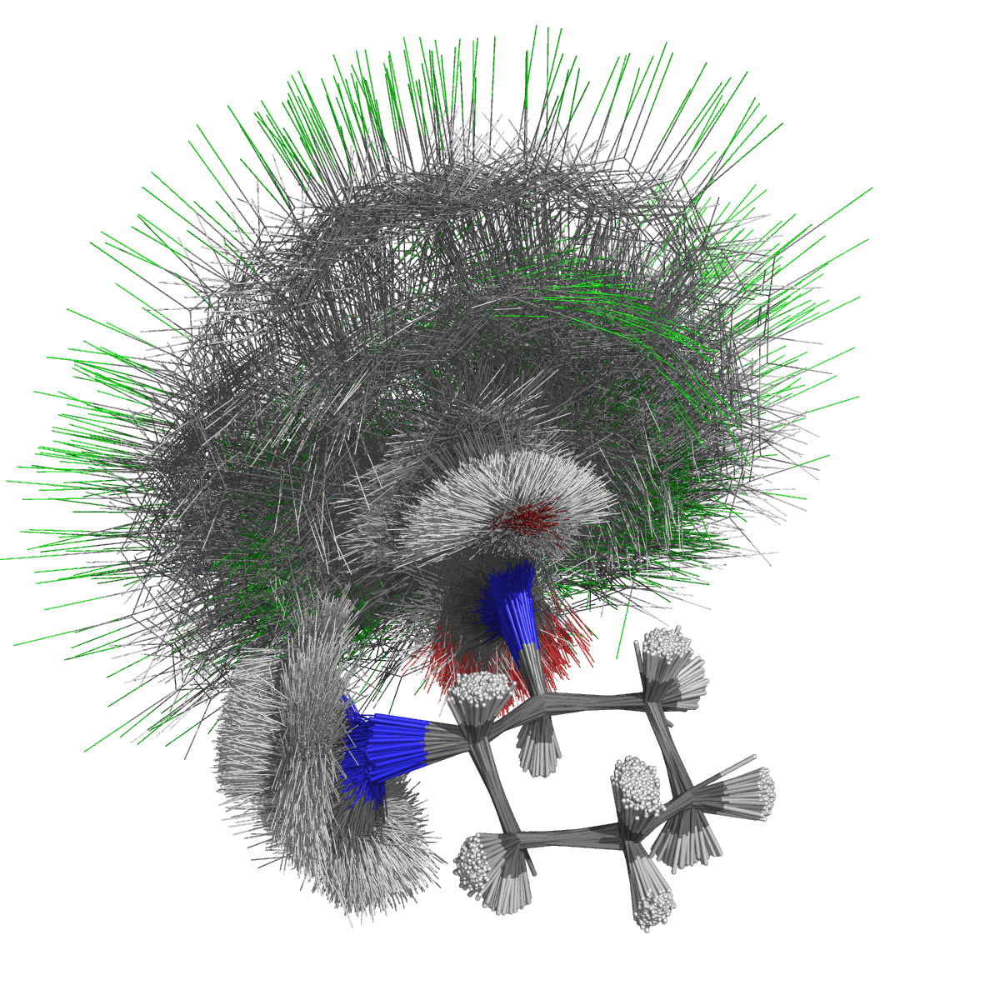

In [19]:
cmd.disable("all")
cmd.enable("cluster_1")

cmd.set_view([ \
     0.775992215,    0.620910704,    0.110931396,\
    -0.182084680,    0.388912857,   -0.903101027,\
    -0.603885055,    0.680602491,    0.414852053,\
    -0.000014184,    0.000064858,  -34.278141022,\
    18.101814270,   13.137313843,   17.552776337,\
   -68.738189697,  137.297653198,  -20.000000000] )

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

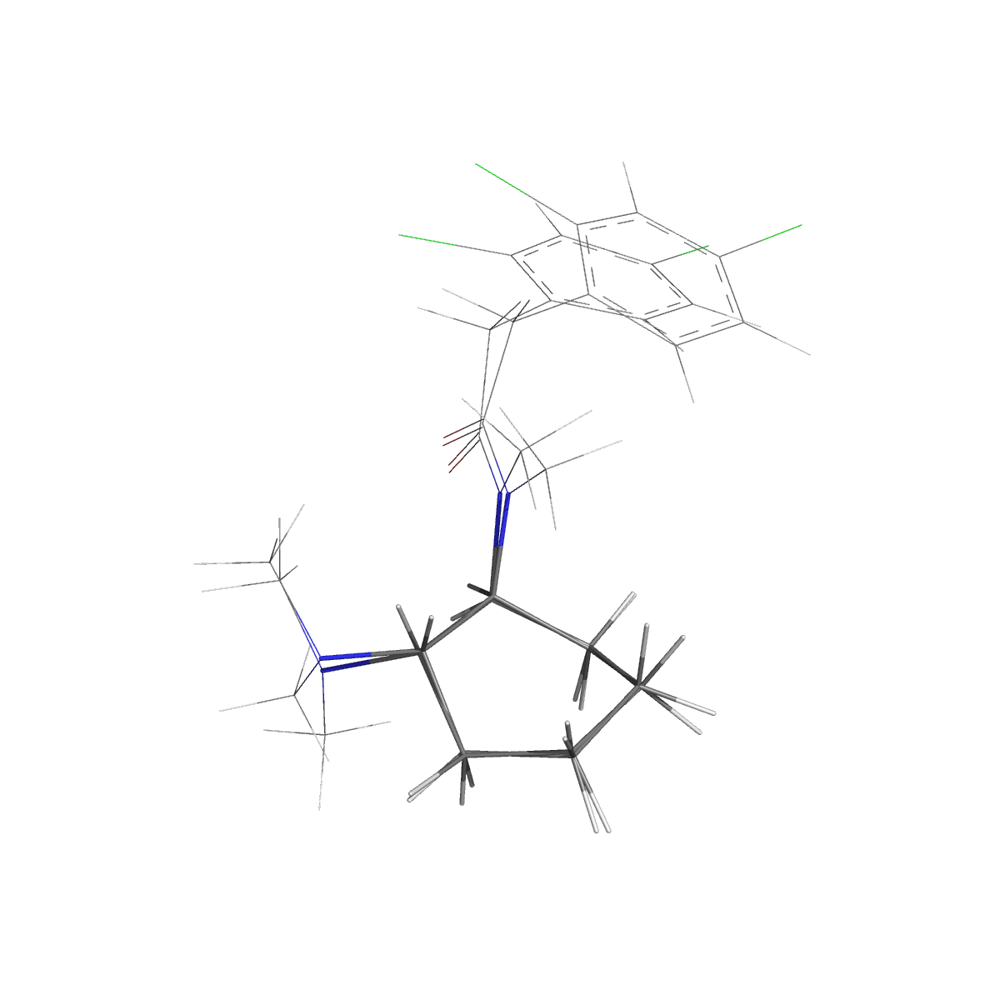

In [18]:
cmd.disable("all")
cmd.enable("cluster_2")

cmd.set_view([ \
    0.775992215,    0.620910704,    0.110931396,\
    -0.182084680,    0.388912857,   -0.903101027,\
    -0.603885055,    0.680602491,    0.414852053,\
     0.000024719,    0.000081398,  -34.277454376,\
    17.924274445,   12.539081573,   16.299600601,\
   -68.738189697,  137.297653198,  -20.000000000] )

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

## Cluster structures based on torsion angle of the aromatic ring

In [38]:
# Extract torsion angles across all states
C1 = "U48800 and id 12"
C2 = "U48800 and id 14"
C3 = "U48800 and id 15"
C4 = "U48800 and id 16"

torsion_angles = []
for state in range(1, num_states + 1):
    C1C2C3C4 = cmd.get_dihedral(C1, C2, C3, C4, state=state)
    torsion_angles.append(C1C2C3C4)

# Assuming torsion_angles is a list of (torsion_1, torsion_2) tuples
df = pd.DataFrame(torsion_angles, columns=['C1C2C3C4'])

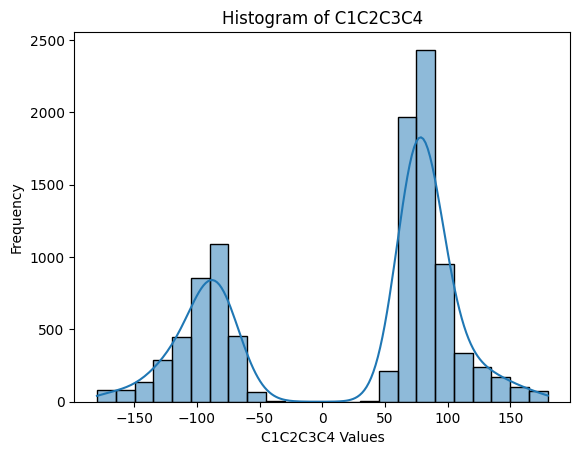

In [39]:
# Add a 'State' column to the DataFrame
df['State'] = range(1, len(df) + 1)

# Assuming df is your DataFrame and it contains a column named 'C1C2C3C4'
sns.histplot(df['C1C2C3C4'], kde=True)  # kde=True adds a Kernel Density Estimate plot on top

plt.title('Histogram of C1C2C3C4')
plt.xlabel('C1C2C3C4 Values')
plt.ylabel('Frequency')
plt.show()

In [45]:
# Define clusters
df['Cluster'] = (df['C1C2C3C4'] > 0).astype(int)

# Count the number of points in each cluster
cluster_counts = df['Cluster'].value_counts()

# Calculate the percentage of points in each cluster
cluster_percentages = cluster_counts / len(df) * 100

# Print cluster counts and percentages
for cluster_id, count in cluster_counts.items():
    percentage = cluster_percentages[cluster_id]
    print(f"Cluster {cluster_id}: {count} structures ({percentage:.2f}%)")

# If you want to include outliers (-1 cluster):
if -1 in cluster_counts:
    outlier_count = cluster_counts[-1]
    outlier_percentage = cluster_percentages[-1]
    print(f"Outliers (-1): {outlier_count} points ({outlier_percentage:.2f}%)")

Cluster 1: 6505 structures (65.04%)
Cluster 0: 3496 structures (34.96%)


In [ ]:
# Selection string for the atoms of interest
selection = "U48800 and (id 15 or id 16 or id 17 or id 18 or id 19 or id 20)"

# Align all states to the first state
cmd.intra_fit(selection, 1)

In [47]:
# Create a new object for each cluster
cmd.delete("a_cluster_*")
grouped = df.groupby('Cluster')
for cluster, group_df in grouped:
    new_object_name = f"a_cluster_{cluster}"
    states = group_df['State'].tolist()
    
    for state in states:
        cmd.create(new_object_name, "U48800", state, -1)
        
# Hide the original object
cmd.disable("all")

In [49]:
cmd.save("aromatic_cluster_0.sdf", "a_cluster_0", state=0)
cmd.save("aromatic_cluster_1.sdf", "a_cluster_1", state=0)

In [3]:
cmd.load("aromatic_cluster_0.sdf", "a_cluster_0")
cmd.load("aromatic_cluster_1.sdf", "a_cluster_1")

In [16]:
print(cmd.get_names() )

['a_cluster_0', 'a_cluster_1']


In [11]:
cmd.enable("all")
cmd.hide("all")
cmd.show("lines")
cmd.set("line_width", 2)

# Define structures to view as transparent (Note: This selection works only for the original pdb and attached trajectory, 
# if using the saved sdf files, atom id 13 should be added and atom id 20 should be removed)
cmd.select("trnsprnt", "not (id 14 or id 15 or id 16 or id 17 or id 18 or id 19 or id 20 or id 21 or id 22 or id 42 or id 43 or id 44 or id 45 or id 46)")

# Define transparent atoms and bonds
cmd.set("line_width", 0.5, "trnsprnt")
cmd.util.cba(104)

In [12]:
# Set all  states to be displayed
cmd.set("all_states", "on")

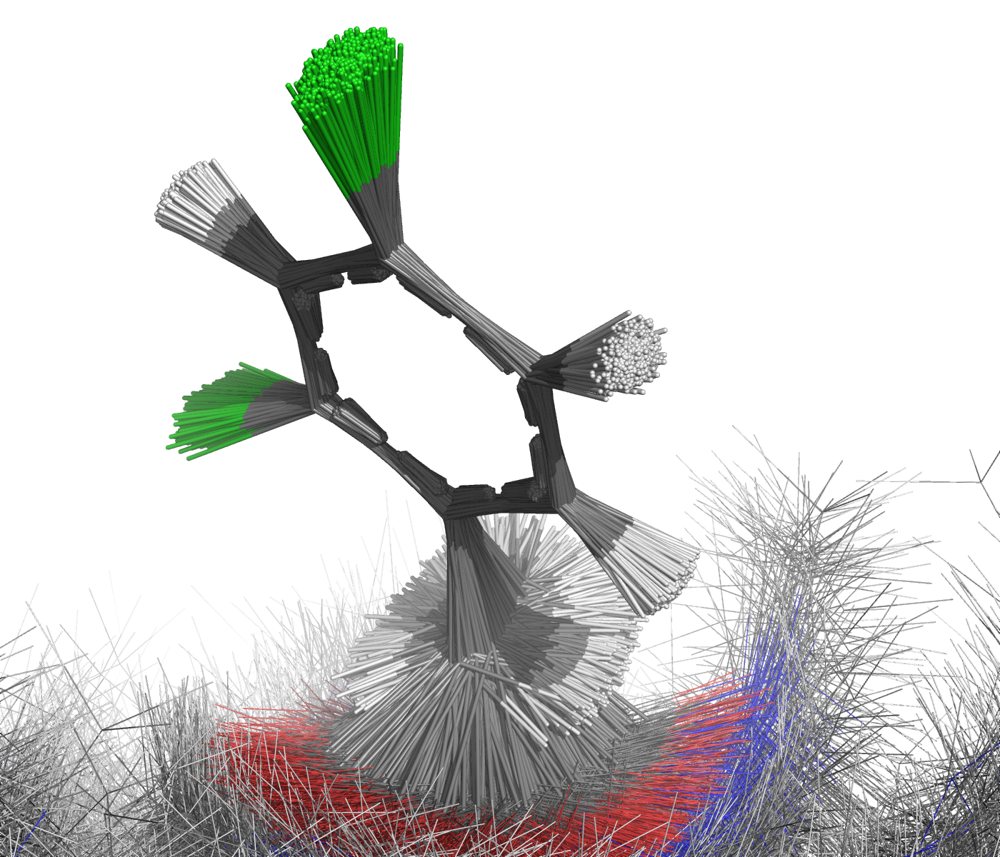

In [14]:
cmd.disable("all")
cmd.enable("a_cluster_0")

cmd.set_view([ \
    -0.751930177,   -0.318177104,   -0.577374578,\
     0.339146107,   -0.937730551,    0.075084627,\
    -0.565317392,   -0.139354825,    0.813019216,\
    -0.000049364,    0.000124823,  -20.478975296,\
    16.133054733,   15.372035027,   17.420248032,\
    15.719653130,   25.247106552,  -20.000000000 ])

cmd.ipython_image(width=1400, height=1200, dpi=300, ray=1)

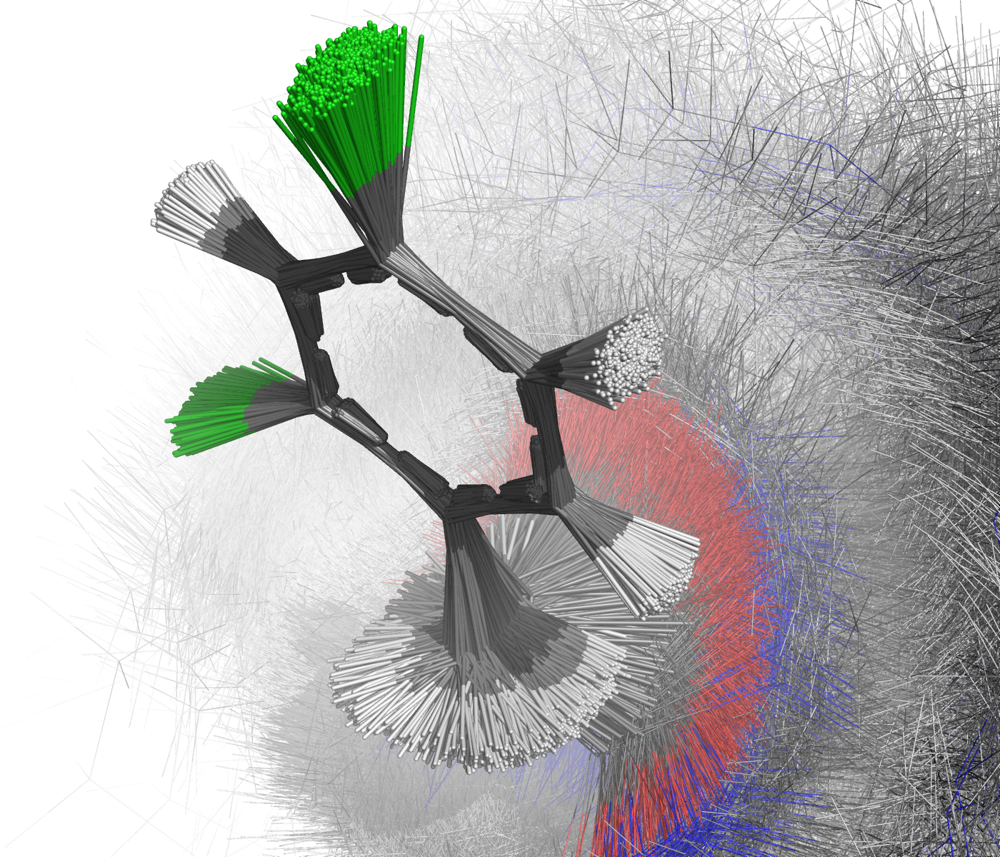

In [17]:
cmd.disable("all")
cmd.enable("a_cluster_1")

cmd.set_view([ \
    -0.751930177,   -0.318177104,   -0.577374578,\
     0.339146107,   -0.937730551,    0.075084627,\
    -0.565317392,   -0.139354825,    0.813019216,\
    -0.000049364,    0.000124823,  -20.478975296,\
    16.133054733,   15.372035027,   17.420248032,\
    15.719653130,   25.247106552,  -20.000000000] )

cmd.ipython_image(width=1400, height=1200, dpi=300, ray=1)